In [ ]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content
fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [ ]:
!ls data/images

bus.jpg  zidane.jpg


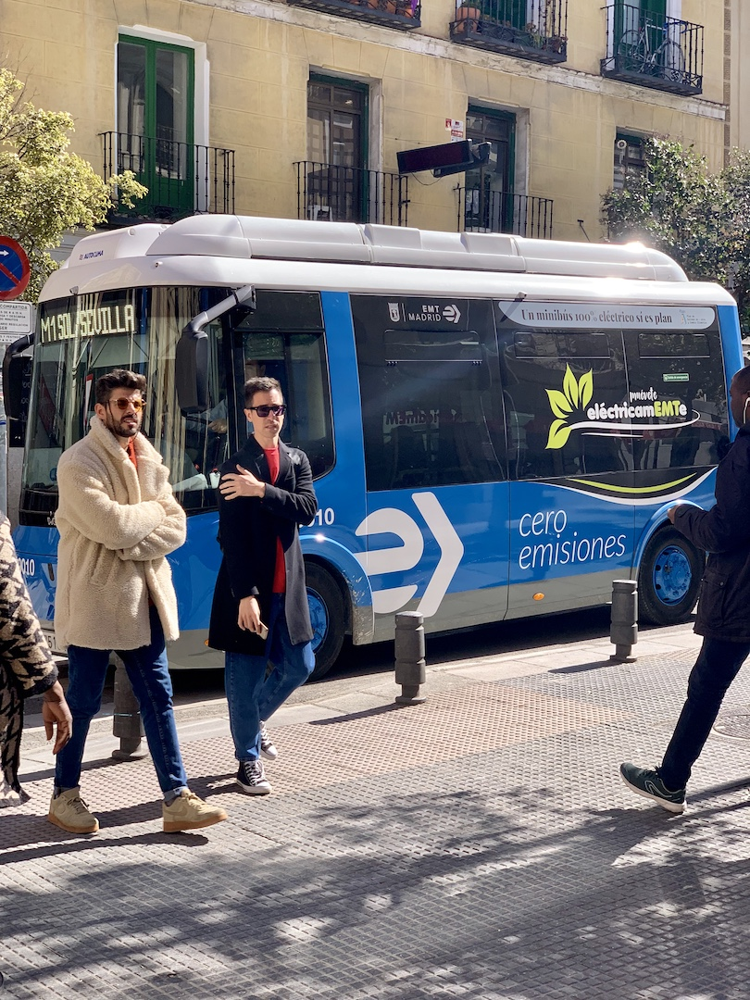

In [ ]:
Image(filename='data/images/bus.jpg',width=600)

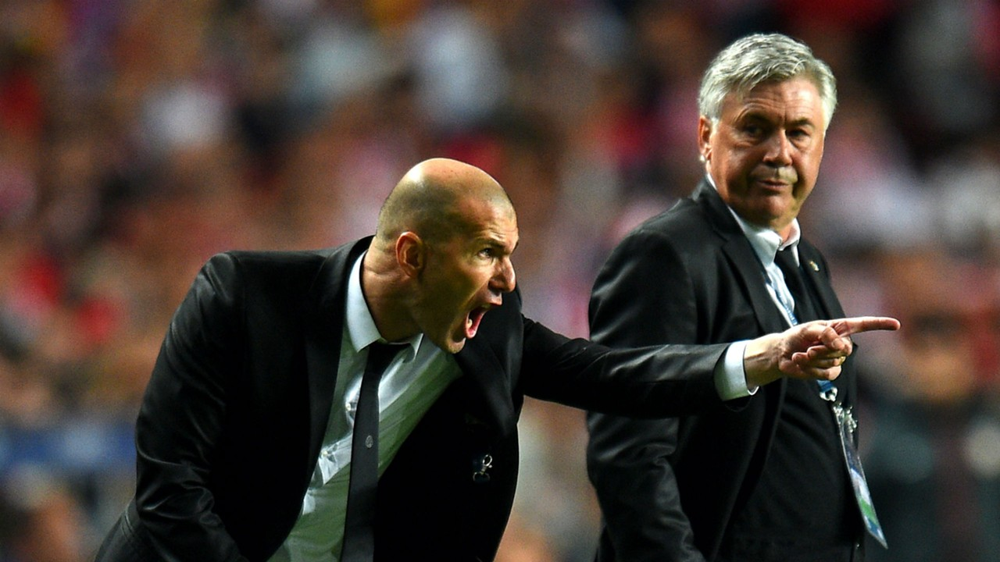

In [ ]:
Image(filename='data/images/zidane.jpg',width=600)

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/

detect: weights=['yolov5s.pt'], source=data/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

100% 14.1M/14.1M [00:00<00:00, 400MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 39.5ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 43.8ms
Speed: 0.5ms pre-process, 41.7ms inference, 15.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/d

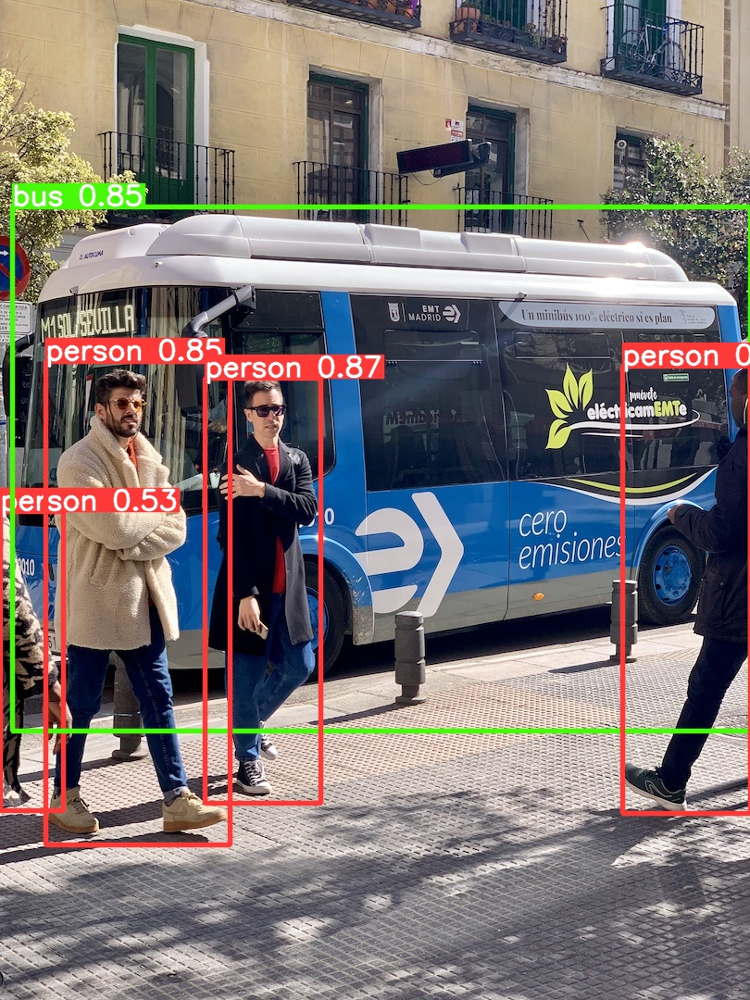

In [ ]:
Image(filename='runs/detect/exp/bus.jpg',width=600)

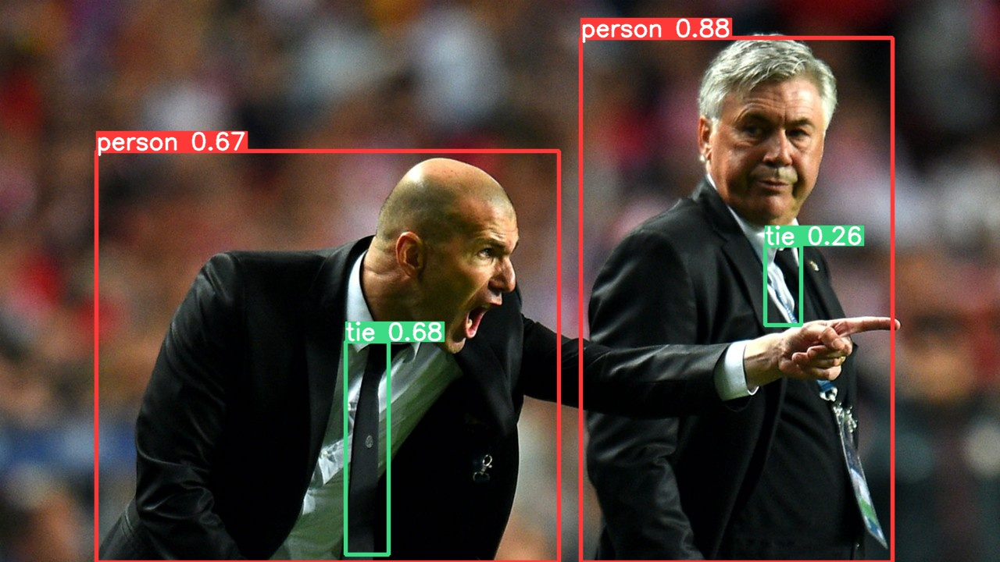

In [ ]:
Image(filename='runs/detect/exp/zidane.jpg',width=600)

In [ ]:
%mkdir /content/yolov5/hardhat
%cd /content/yolov5/hardhat
!curl -L "https://public.roboflow.com/ds/TpMdkEbWHB?key=z6rmq1G8Fx" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
 extracting: train/labels/000605_jpg.rf.0c32e7a0bc3cb35efb487e563bd531d2.txt  
 extracting: train/labels/000343_jpg.rf.0c2f20c5673eb0132c8f6d63906c5f2d.txt  
 extracting: train/labels/004238_jpg.rf.0c3465deac398afe856c752cc9d98852.txt  
 extracting: train/labels/004029_jpg.rf.0c5c615d8dc20133e108e813eca4234a.txt  
 extracting: train/labels/002532_jpg.rf.0cc8d54d2b360fa57e5402d53edae103.txt  
 extracting: train/labels/001680_jpg.rf.0c5c6aceea85a79a7a2404a54a6edc68.txt  
 extracting: train/labels/000015_jpg.rf.0c0cedbd11befb87888bc8887dca5a52.txt  
 extracting: train/labels/004978_jpg.rf.0cd5eb9b3507044f9cdcc2f2abee4f0b.txt  
 extracting: train/labels/002500_jpg.rf.0c525ff7b9202f6ed81fbcc8a1ce7831.txt  
 extracting: train/labels/003833_jpg.rf.0c6929cb9362e0f95beed22139bcb644.txt  
 extracting: train/labels/002127_jpg.rf.0a642389755589a074e3a2e35c8f4d0f.txt  
 extracting: train/labels/005215_jpg.rf.0c3bc4a4b40f03461eb7ae77a252210a.txt  
 extracting: tra

In [ ]:
from glob import glob

train_img_list = glob('/content/yolov5/hardhat/train/images/*.jpg')
test_img_list = glob('/content/yolov5/hardhat/test/images/*.jpg')
print(len(train_img_list),len(test_img_list))

5269 1766


In [ ]:
from sklearn.model_selection import train_test_split

test_img_list, val_img_list = train_test_split(test_img_list,test_size=0.5, random_state=777)
print(len(test_img_list),len(val_img_list))

883 883


In [ ]:
import yaml

with open('/content/yolov5/hardhat/train.txt','w') as f:
  f.write('\n'.join(train_img_list)+'\n')

with open('/content/yolov5/hardhat/test.txt','w') as f:
  f.write('\n'.join(test_img_list)+'\n')

with open('/content/yolov5/hardhat/val.txt','w') as f:
  f.write('\n'.join(val_img_list)+'\n')

In [ ]:
%cat /content/yolov5/hardhat/data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['head', 'helmet', 'person']

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
  with open(line,'w') as f:
    f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/hardhat/data.yaml

train: ./hardhat/train/images
test: ./hardhat/test/images
val: ./hardhat/test/images

nc: 3
names: ['head', 'helmet', 'person']

In [ ]:
%cat /content/yolov5/hardhat/data.yaml


train: ./hardhat/train/images
test: ./hardhat/test/images
val: ./hardhat/test/images

nc: 3
names: ['head', 'helmet', 'person']


In [ ]:
with open('data.yaml','r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

In [ ]:
%time
%cd /content/yolov5
!python train.py --img 416 --batch 64 --epochs 100 --data ./hardhat/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name hardhat_results --cache

CPU times: user 1 µs, sys: 1e+03 ns, total: 2 µs
Wall time: 5.01 µs
/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./hardhat/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=hardhat_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005,

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!ls runs/train/hardhat_results

confusion_matrix.png				    results.png
events.out.tfevents.1683090263.68ca8f8213dc.6294.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights


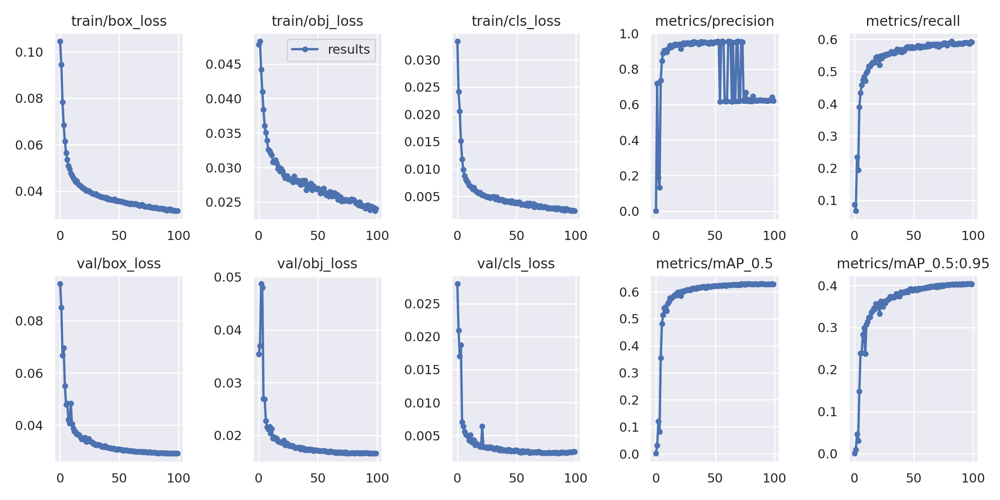

In [ ]:
Image(filename='runs/train/hardhat_results/results.png',width=1000)

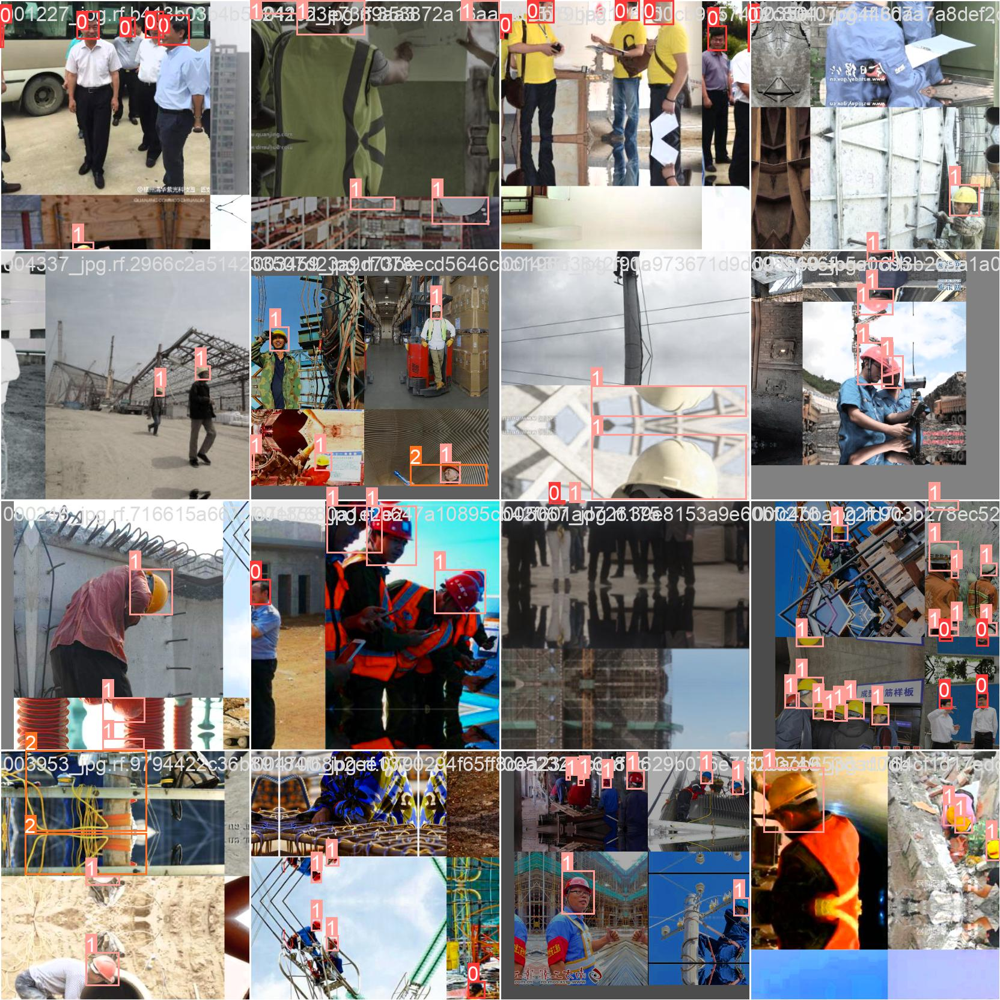

In [ ]:
Image(filename='runs/train/hardhat_results/train_batch0.jpg',width=1000)

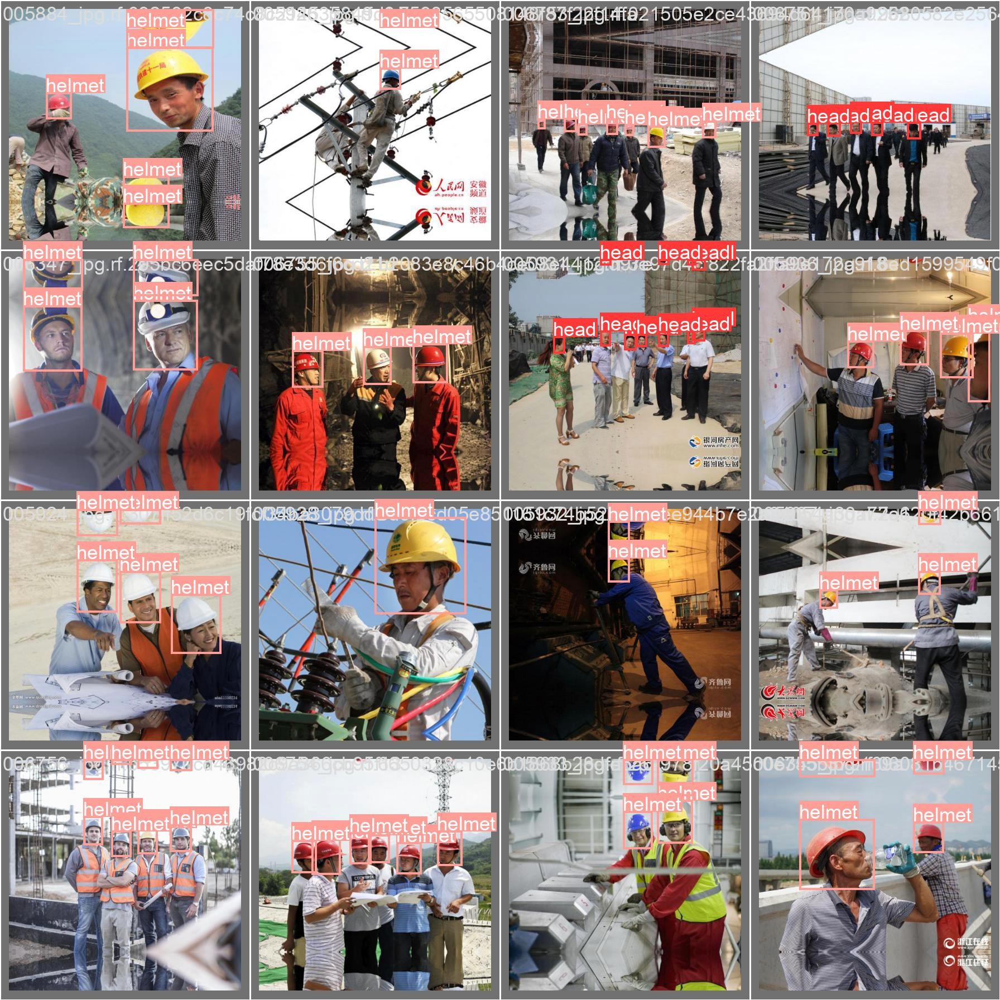

In [ ]:
Image(filename='runs/train/hardhat_results/val_batch0_labels.jpg',width=1000)

In [ ]:
!python val.py --weights runs/train/hardhat_results/weights/best.pt --data ./hardhat/data.yaml --img 416 --task test

val: data=./hardhat/data.yaml, weights=['runs/train/hardhat_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/yolov5/hardhat/test/labels.cache... 1766 images, 0 backgrounds, 0 corrupt: 100% 1766/1766 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 56/56 [00:18<00:00,  3.00it/s]
                   all       1766       8915      0.623      0.589      0.628      0.404
                  head      

In [ ]:
%ls runs/train/hardhat_results/weights

best.pt  last.pt


In [ ]:
!python detect.py --weights runs/train/hardhat_results/weights/best.pt --img 416 --conf 0.4 --source ./hardhat/test/images/

detect: weights=['runs/train/hardhat_results/weights/best.pt'], source=./hardhat/test/images/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1766 /content/yolov5/hardhat/test/images/005298_jpg.rf.7d1070e4a462d4c636a68e64f2013761.jpg: 416x416 7 helmets, 7.4ms
image 2/1766 /content/yolov5/hardhat/test/images/005299_jpg.rf.a79cacc62cdd99ad871cf1786ad865ff.jpg: 416x416 1 helmet, 7.4ms
image 3

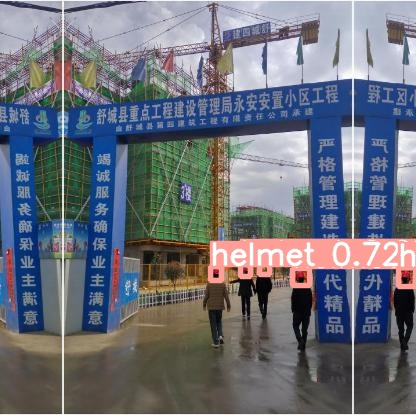

In [ ]:
import glob
import random
image_name = random.choice(glob.glob('runs/detect/exp2/*.jpg'))
display(Image(filename=image_name))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%mkdir /content/drive/MyDrive/hardhat1
%cp runs/train/hardhat_results/weights/best.pt /content/drive/MyDrive/hardhat1